<center><h1>Deep Dive in Image Pre-processing Methods 🔥🔥🔥</h1><center>

<img src="https://i.imgur.com/s1GeDmW.jpg" style="width:800px;height:800px;">

<center><p style="padding-left:340px;color:red">Fig0: Photo by Jeremy Bishop on Unsplash</p><center>


### Table of content:
1. Color Space
      - RGB Color Space
      - HSV color space
      - HSL color space
2. Basic Geometric Transformations
      - Image Translation
      - Image Resizing
      - Image Rotating
      - Image cropping
3. Thresholding
      - Normal Thresholding
      - Adaptive Thresholding
4. Bluring  and Smoothing
      - Gaussian Blurring
      - Median Blurring
      - Using Builtin Kernels(cv2.blur())
      - Using user-defined Kernels(cv2.filter2D())
5. Color Histograms
      - How to create a normal Histogram?
      - How to create a histogram for all color channels?
      - How to create a histogram for a masked portion an image?
      - How to perform histogram equalizer?
6. Line Detection

I will be discussing different Image preprocessing techniques, that we can apply in different images.I also have discussed about different object detection techniques like, **Template Matching,Corner Detection,Harris Corner Detection,Shi-Tomasi,Corner Detection,Edge detection,Contour Detection,Furier Transform,Face Detection with OpenCV Haar Cascade. **
So, if want to check it out ckick <a href="https://setosa.io/ev/image-kernels/" class="btn btn-primary" style="color:white;">Here</a>

## Learn Image Processing
### What is Colorspace?
--> Color is a continuous phenomenon, it means there is an infinite number of colors. But, the human eye and perception are limited. So, to identify those colors we need a medium or representation of those colors and this representation of color is called color space. In technical terms, a color model or color space is a specification of a 3-D coordinate system and a subspace within that system where each color is represented by a single point.

### What are the types of Colorspace?
--> There are mainly five major color models out there. But, I am going to write about only the frequent ones(RGB, HSV, and HSL).

1. RGB(Red Green Blue)
2. HSL(Hue Saturation Lightness)
3. HSV(Hue Saturation Value)
4. YUV(Luminance, blue–luminance, red–luminance)
5. CMYK(Cyan, Magenta, Yellow, Key)

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import glob
import os
from tqdm import tqdm

%matplotlib inline

In [2]:
X=[]
Z=[]
IMG_SIZE=150
FLOWER_SUNFLOWER_DIR='../input/flowers-recognition/flowers/flowers/sunflower'

In [3]:
X=[]
Z=[]
IMG_SIZE=150
FLOWER_SUNFLOWER_DIR='../input/flowers-recognition/flowers/flowers/sunflower'
def assign_label(img,flower_type):
    return flower_type


In [4]:
#FUNCTION TO LOAD DATA
def make_train_data(flower_type,DIR):
    for img in tqdm(os.listdir(DIR)):
        label=assign_label(img,flower_type)
        path = os.path.join(DIR,img)
        img = cv2.imread(path,cv2.IMREAD_COLOR)
        img = cv2.resize(img, (IMG_SIZE,IMG_SIZE))#Resizing the image
        
        X.append(np.array(img))#we are storing the data in the form of a list
        Z.append(str(label))# we are also storing the label in the form of a list

In [5]:
#Loading Sunflower Data
make_train_data('Sunflower',FLOWER_SUNFLOWER_DIR)
print(len(X))

100%|██████████| 734/734 [00:05<00:00, 137.06it/s]

734


### RGB COLOR SPACE :
#### RGB Color Space:
--> RGB color space is one of the well-known color space represented by Red, Green, and Blue coordinates of the 3-D coordinate system. In more technical terms, RGB describes a color as a tuple of three components. Each component can take a value between 0 and 255, where the tuple (0, 0, 0) represents black and (255, 255, 255) represents white. Zeroth, first and second component of the tuple represents the amount of Red, Green, and Blue respectively.


<center><img src="https://i.imgur.com/RCIr2Vp.png" ></center>
<center><p style="padding-left:380px;color:red">Fig1:RGB Color Space</p></center>

In [6]:
fix_img = cv2.cvtColor(X[0],cv2.COLOR_BGR2RGB)# THIS IS HOW TO CONVERT BGR COLOR SPACE TO RGB COLOR SPACE

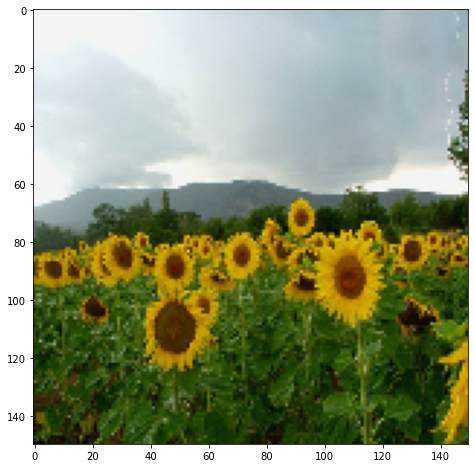

In [7]:
plt.figure(figsize = (12,8))
plt.imshow(fix_img)

In [8]:
new_img_1 = fix_img.copy() 


In [9]:
new_img_1.shape


(150, 150, 3)

In [10]:
new_img_1[:,:,0] = 0 # making R channel zero
new_img_1[:,:,1] = 0 #making G channel zero

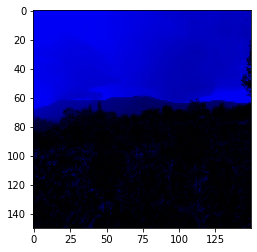

In [11]:
plt.imshow(new_img_1) # Finally having blue version of that image

In [12]:
new_img_2 = fix_img.copy()
new_img_3 = fix_img.copy()

In [13]:
#For Red color Channel
new_img_2[:,:,1] = 0
new_img_2[:,:,2] = 0
#For Green color channel
new_img_3[:,:,0] = 0
new_img_3[:,:,2] = 0

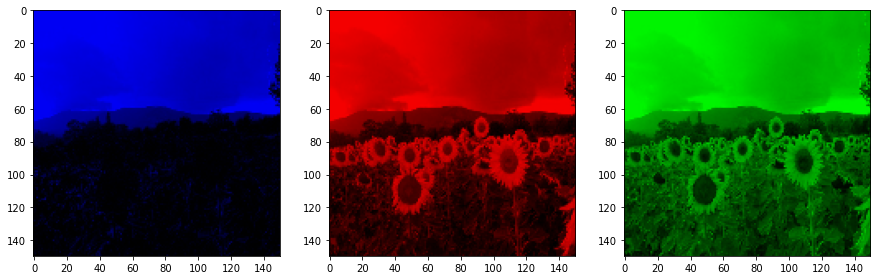

In [14]:
f, axes = plt.subplots(1,3, figsize = (15,15))
list = [new_img_1,new_img_2,new_img_3]
i = 0
for ax in axes:
    ax.imshow(list[i])
    i+=1

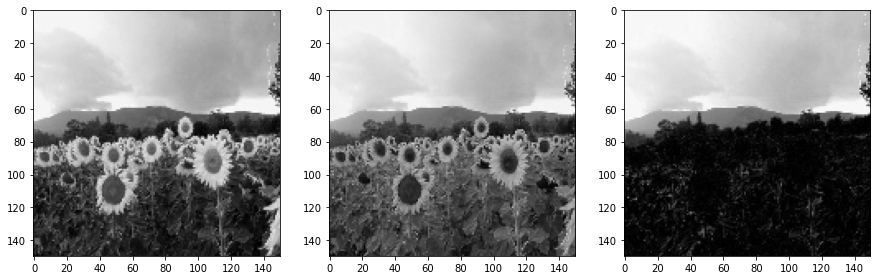

In [15]:
f, axes = plt.subplots(1,3, figsize = (15,15))
list = [fix_img[:,:,0],fix_img[:,:,1],fix_img[:,:,2]]
i = 0
for ax in axes:
    ax.imshow(list[i],cmap = 'gray')
    i+=1

###  Converting RGB ColorSpace in HSL color Space:
#### HSL Color Space:
--> The general meaning of HSL is Hue, Saturation, and Lightness. You can visualize HSL in the form of a cylinder as shown in fig:2(a). All around the cylinder will be different colors, Like green, yellow, red, etc. (the actual hue we are looking for). Saturation is how many hue you end up having and lightness is how dark or how bright the color is. As you can see the top of the cylinder is full of white and the bottom part is full black.


<center><img src="https://i.imgur.com/8Ul3k79.jpg" ></center>
<center><p style="padding-left:380px;color:red">Fig2:HSL Color Space</p></center>

In [16]:
hsl_img = cv2.cvtColor(X[0],cv2.COLOR_BGR2HLS)


In [17]:
hsl_img.shape


(150, 150, 3)

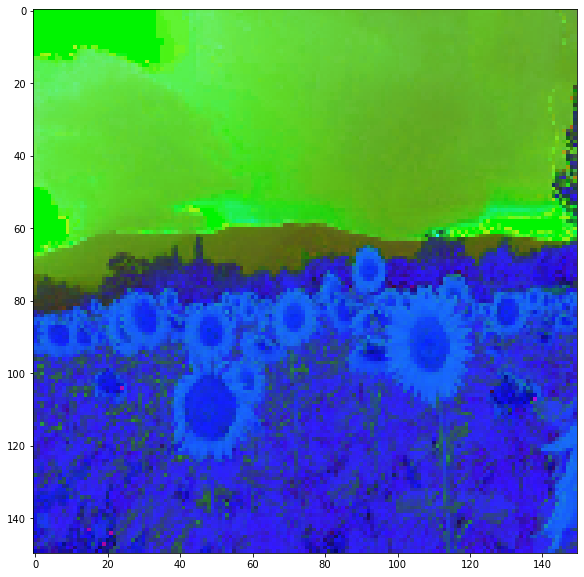

In [18]:
plt.figure(figsize=(12,10))
plt.imshow(hsl_img)

In [19]:
hsl_img_1 = hsl_img.copy()
hsl_img_2 = hsl_img.copy()
hsl_img_3 = hsl_img.copy()

In [20]:
#HUE --> ZERO
hsl_img_1[:,:,1] = 0
hsl_img_1[:,:,2] = 0
#SATURATION --> ZERO
hsl_img_2[:,:,0] = 0
hsl_img_2[:,:,2] = 0
#LIGHTNESS --> ZERO
hsl_img_3[:,:,0] = 0
hsl_img_3[:,:,1] = 0

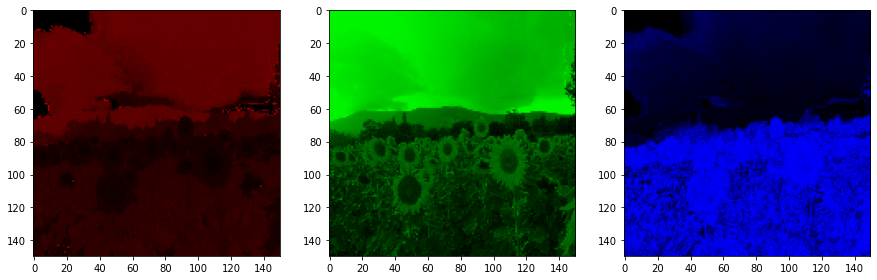

In [21]:
f, axes = plt.subplots(1,3, figsize = (15,15))
list = [hsl_img_1,hsl_img_2,hsl_img_3]
i = 0
for ax in axes:
    ax.imshow(list[i])
    i+=1

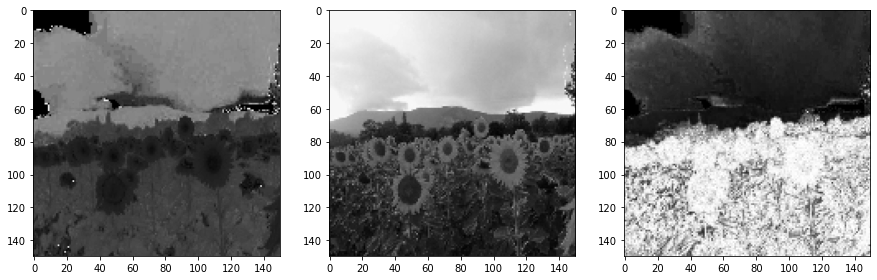

In [22]:
f, axes = plt.subplots(1,3, figsize = (15,15))
list = [hsl_img[:,:,0],hsl_img[:,:,1],hsl_img[:,:,2]]
i = 0
for ax in axes:
    ax.imshow(list[i],cmap = "gray")
    i+=1

### RGB to HSV Colorspace Convertion:
#### HSV Color Space:
--> The name HSV is coming from the three coordinates of the color model which are Hue, Saturation, and Value. It is also a cylindrical color model where the radius of that cylinder implies Saturation, Vertical axis implies the Value and the angle represents the Hue. Hue is the dominant color as perceived by as an observer, Saturation is the amount of white light mixed with a hue and Value is the chromic notion of intensity, lower the Value, the color gets more similar to black and higher the value, the color gets more similar to the color itself. By changing these parameters we can generate different colors.


<center><img src="https://i.imgur.com/cTZgUdS.jpg" ></center>
<center><p style="padding-left:380px;color:red">Fig3:HSV Color Space</p></center>

In [23]:
hsv_img = cv2.cvtColor(X[0],cv2.COLOR_BGR2HSV)

In [24]:
hsv_img.shape

(150, 150, 3)

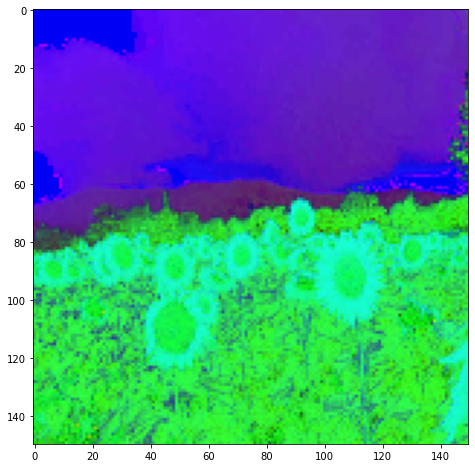

In [25]:
plt.figure(figsize = (10,8))
plt.imshow(hsv_img)

In [26]:
hsv_img_1 = hsv_img.copy()
hsv_img_2 = hsv_img.copy()
hsv_img_3 = hsv_img.copy()

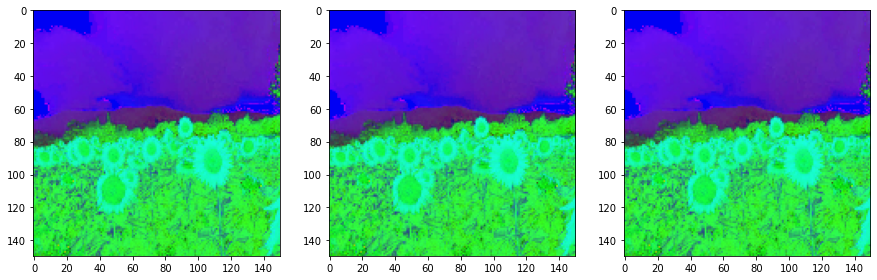

In [27]:
f, axes = plt.subplots(1,3, figsize = (15,15))
list = [hsv_img_1,hsv_img_2,hsv_img_3]
i = 0
for ax in axes:
    ax.imshow(list[i])
    i+=1

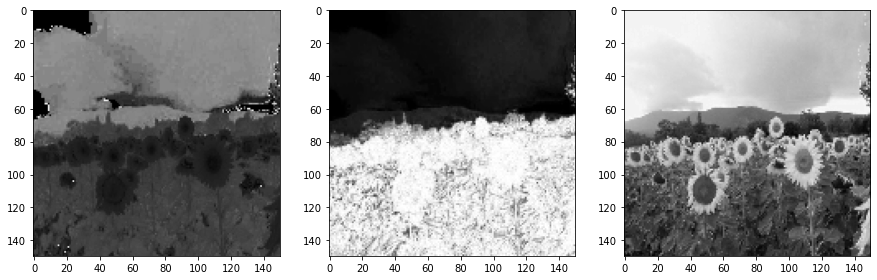

In [28]:
f, axes = plt.subplots(1,3, figsize = (15,15))
list = [hsv_img[:,:,0],hsv_img[:,:,1],hsv_img[:,:,2]]
i = 0
for ax in axes:
    ax.imshow(list[i],cmap = "gray")
    i+=1

## Basic Geometric Transformations:
* Image Translation
* Image Resizing
* Image Rotating
* Image cropping

In [29]:
!pip install opencv-contrib-python==4.2.0.34

     |████████████████████████████████| 34.2 MB 42.9 MB/s 
You should consider upgrading via the '/opt/conda/bin/python3.7 -m pip install --upgrade pip' command.


In [30]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline


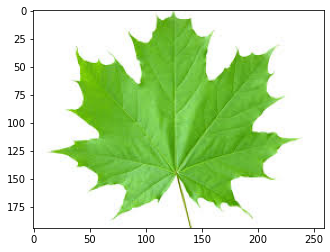

In [31]:
pic = cv2.imread('../input/cv-object-detecton-dataset/CV Object Detecton Dataset/leaf.jfif')
pic = cv2.cvtColor(pic,cv2.COLOR_BGR2RGB)
plt.imshow(pic)

In [32]:
type(pic)

numpy.ndarray

In [33]:
matrix = np.float32([[1,0,20],[0,1,30]])

In [34]:
rows,cols,chn = pic.shape
print('height:{}'.format(rows))
print('width:{}'.format(cols))
print("pic shape: {} ".format(pic.shape))

height:194
width:259
pic shape: (194, 259, 3) 


In [35]:
translated_pic = cv2.warpAffine(pic,matrix,(cols,rows))

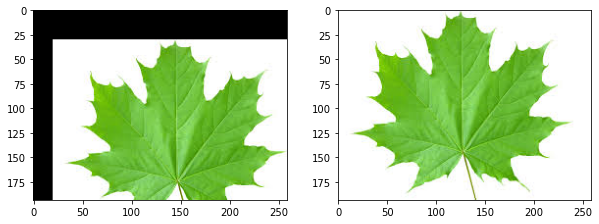

In [36]:
plt.figure(figsize=(10,8))
plt.subplot(121)
plt.imshow(translated_pic)

# plt.figure(figsize=(10,8))
plt.subplot(122)
plt.imshow(pic)
plt.show()

In [37]:
translated_pic.shape

(194, 259, 3)

### Resizing

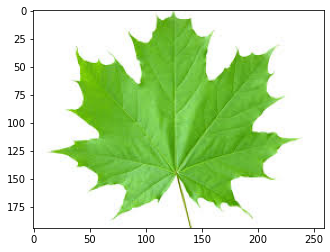

In [38]:
pic = cv2.imread('../input/cv-object-detecton-dataset/CV Object Detecton Dataset/leaf.jfif')
pic = cv2.cvtColor(pic,cv2.COLOR_BGR2RGB)
plt.imshow(pic)

In [39]:
pic.shape

(194, 259, 3)

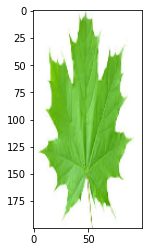

In [40]:
resized_pic = cv2.resize(pic,(100,200))
plt.imshow(resized_pic)

In [41]:
resized_pic.shape

(200, 100, 3)

### Using Fractions --> Like what is the percentage by which you want to resize the image(I wanna resize the image by 50 percent from both height and width)

In [42]:
width_ratio = 0.5
height_ratio = 0.5
resized_pic2 = cv2.resize(pic,(0,0),pic,width_ratio,height_ratio)

shape:(97, 130, 3)


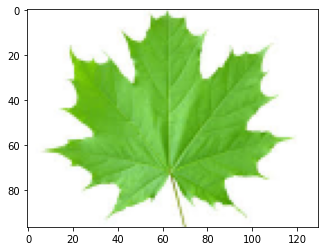

In [43]:
plt.imshow(resized_pic2)
print('shape:{}'.format(resized_pic2.shape))# shape reduced by 50%

### Image Rotation

In [44]:
rotate = cv2.flip(pic,0)#you also can pass value like--> 0,1,-1 etc.

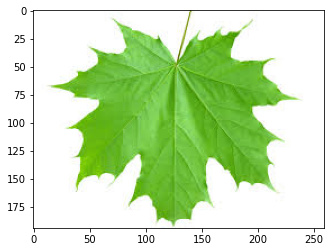

In [45]:
plt.imshow(rotate)# Rotated by 180 degree

### Image Croping:


In [46]:
pic1 = cv2.imread('../input/cv-object-detecton-dataset/CV Object Detecton Dataset/gorilla.jpg')
pic1 = cv2.cvtColor(pic1,cv2.COLOR_BGR2RGB)

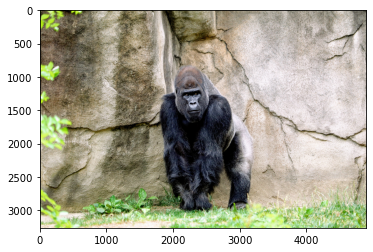

In [47]:
plt.imshow(pic1)

In [48]:
pic1.shape

(3265, 4898, 3)

In [49]:
crop = pic1[800:3000,1800:3200]

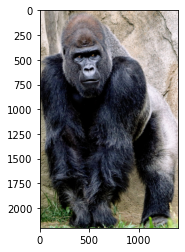

In [50]:
plt.imshow(crop)#Croped Image

<h1 style="background-color: orange;color: rgb(255, 255, 255);text-align: center;padding-top: 30px;padding-bottom: 30px;">Thresholding</h1>

If I try to explain thresholding in the simplest manner, that will be, it is a method of creating a binary image from a normal image. We need to use a grayscale image in order to apply thresholding on a normal image.
<h1><span class="label label-success">Applications:-</span></h1>
<p>There are so many applications in computer vision,one of the general appliactions are- </p>
<ol style= "padding-left: 235px">
    <li>Segmentation</li>
    <li>Mask creation</li>
    <li>Edge Detection</li>
    <li>Line Detection etc.</li>
</ol>
<h1><span class="label label-success">Methods:-</span></h1>
<p>The general method of creating a thresholded image is like that- we take an image then make that a grayscale image so that we can get the range of pixel values from 0 to 255, in the image if the pixel values are greater than the desired value (generally it is called threshold value) we replace those by 1 and pixels those are lesser than that desired value get replaced by 0(zero). Thus we create a desired binary image from a normal image.</p>
But, there are way more different methods to create a threshold image but the basic intuition is the same as above.

<h1><span class="label label-success">OpenCV Implimentation:-</span></h1>
<p>For implementing thresholding we use the builtin function called <strong>cv2.threshold()</strong> which returns the threshold value and the thresholded image in the form of a tuple.Adaptive thresholding also does the same kind of thing just there are some more parameters for playing around(<i>implimented in the below cells using <strong>cv2.adaptiveThreshold()</strong></i>).There are different ways of creating a thresholded image, like-</p>
<ol style="padding-left:235px">
    <li>Binary</li>
    <li>Inverted Binary</li>
    <li>Truncated</li>
    <li>To Zero</li>
    <li>To Zero Inverted</li>
    <li>Otsu’s Binarization</li>
</ol>
<p>Last one is pretty effective, the <strong>Otsu’s Binarization</strong>.In terms of creating a desired thresholded image, we will be needing a threshold value and finding that is a trial and error process. But, we can use Otsu’s Binarization which does not take any threshold value to create one, it just only needs the min and max pixel values. </p>

But, in other methods we need to pass 1st arg as the gray image itself the 2nd arg as the threshold value(usually the mean value of pixel values) then 3rd arg as the max pixel value and as the last arg we pass the method using which we are going to do the thresholding. Check out the below image to understand different methods of thresholding.

<center><img src="https://i.imgur.com/FnZOvQK.png" ></center>
<center><p style="padding-left:380px;color:red">Fig1:Different type of Thresholding</p></center>

In [51]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

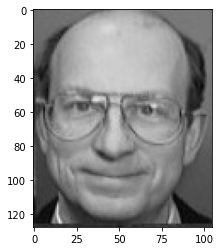

In [52]:
img = cv2.imread('../input/cv-object-detecton-dataset/CV Object Detecton Dataset/SharedScreenshot1.jpg',0)
plt.imshow(img,cmap = 'gray')

In [53]:
img.max()/2#Finding middle value of the distribution of the pixel value

122.5

In [54]:
'''1st arg as the gray image itself the 2nd arg as the threshold value(usually the mean value of pixel values) then 3rd 
arg as the the max pixel value and as the last arg we pass the method using which we are going to do the thresholding'''
ret3,thresh3 = cv2.threshold(img,123,255,cv2.THRESH_TRUNC)

In [55]:
ret, thresh1 = cv2.threshold(img,123,255,cv2.THRESH_BINARY)

In [56]:
ret, thresh2 = cv2.threshold(img,123,255,cv2.THRESH_TRIANGLE)

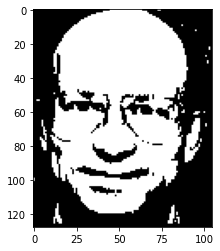

In [57]:
plt.imshow(thresh1,cmap = 'gray')

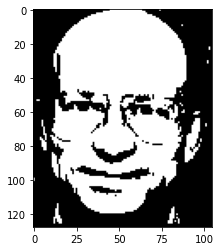

In [58]:
plt.imshow(thresh2,cmap = 'gray')

In [59]:
diff = thresh1 - thresh2

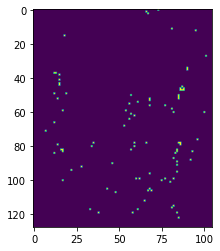

In [60]:
plt.imshow(diff)

In [61]:
diff1 = thresh1 - thresh3

In [62]:
sum1 = thresh1 + thresh3

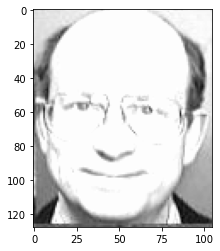

In [63]:
plt.imshow(sum1,cmap = 'gray')

In [64]:
'''1st arg: Gray image itself
   2nd arg:Max pixel value
   3rd arg: Type for calculating mean
   4th arg:thresholding type
   5th arg: block size(size of the pixel neighbourhood for calculate a threshold, it is needed to be odd like-3,5,7 etc.)
   6th arg: c constant(Generally a constant value & a odd number)'''
th2 = cv2.adaptiveThreshold(img,255,cv2.ADAPTIVE_THRESH_MEAN_C,cv2.THRESH_BINARY,11,8)

In [65]:
th3 = cv2.adaptiveThreshold(img,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY,11,8)

In [66]:
th = th3 - th2
th.shape

(128, 105)

In [67]:
'''import numpy as np
th1 = np.mean(th)
print(th1)'''


'import numpy as np\nth1 = np.mean(th)\nprint(th1)'

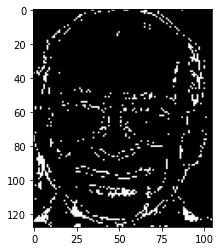

In [68]:
plt.imshow(th,cmap = 'gray')

<h1 style="background-color:rgb(183, 0, 255);color: rgb(255, 255, 255);text-align: center;padding-top: 30px;padding-bottom: 30px;">Bluring and Smoothing</h1>

<h1><span class="label label-success">Intro:-</span></h1>
<p>This thing needs no explanation the title explains everything. Some time for finding features or to remove noise we sometimes need to perform blurring and smoothing. Blurring and smoothing is one of the important toolkits of your image processing toolbox. But, the main problem in doing that is there are so many methods, available in OpenCV for performing blurring and smoothing, like-</p>
<ol style= "padding-left: 235px">
    <li>Gaussion Blurring</li>
    <li>Median Bluring</li>
    <li>Bilateral Blurring</li>
    <li>Gamma Currection</li>
    <li>Using Builtin Kernels(<i>cv2.blur()</i>)</li>
    <li>Using user defined Kernels(<i>cv2.filter2D()</i>) etc.</li>
</ol>

<p>So, what to use 🤔? Mainly people use Gaussian Blurring for the first time, if it doesn't work then they go for other methods, mainly I try to follow this pattern. But, one the other hand is true that nothing is sure which one will help you to get your job done, you have to keep trying different methods until you find your desired image, except the in every method, there are multiple parameters to tune, which might give you better results.</p>
<h1><span class="label label-success">How it works?🤔</span></h1>
<p>So, generally there will be a kernel(<i>kernels are nothing but array of numbers</i>) for perfoeming different kind of operations and we will be multyplying them with the normal image and taking the the sum of that and consider that as a pixel value.This is the kernel for blurring-</p>

<div class="column">
    <img src="https://i.imgur.com/XUFtFWJ.png" style="width:500px;height:250px;">
    <center><p style="padding-left:380px;color:red">Fig1:Filter for blurring</p></center>
  </div>
 
<h3 style="text-align:center">And this the result of blurring 👇👇👇</h3>
<div class="column">
    <img src="https://i.imgur.com/P2qg11V.png" style="width:500px;height:250px;">
    <center><p style="padding-left:380px;color:red">Fig2:After applying blurring</p></center>
  </div>
<a href="https://setosa.io/ev/image-kernels/" class="btn btn-primary" style="color:white;">Here</a> is the website website which has a kind of visualizasion to understand how blurring and smoothing worksAs I said above that there different kernels for different perpous,this is the kernel for shearpening the image
<div class="column">
    <img src="https://i.imgur.com/mmCCgse.png" style="width:500px;height:250px;">
    <center><p style="padding-left:380px;color:red">Fig3:Filter for smoothing</p></center>
  </div>
  
<h3 style="text-align:center">This is how the normal image look like after being sherpen 👇👇👇</h3>
<div class="column">
    <img src="https://i.imgur.com/XOMTx4w.png" style="width:500px;height:250px;">
    <center><p style="padding-left:380px;color:red">Fig4:image after smoothing</p></center>
  </div>

We will be using a customized, which is consist of a bule brick wall image and a red text putted in it

So, lets jump to the code, so much of theory😒.
#### Concept:
So I am going to use a picture of a blue wall and then i will put some text on the top of that, which will make use understand the intensity of the algos or how efficient they are. I am taking `cv2.FONT_HERSHEY_COMPLEX` as my font type, which has a kind of gap inside a letter wich is going to be blured if we use blurring on them.

In [69]:
#Function for Loading the image
def load_img():
    img = cv2.imread('../input/cv-object-detecton-dataset/CV Object Detecton Dataset/blue_brick.jpg')
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    return img

In [70]:
#Function for displaying the image
def disp_img(img,cmap = None):
    fig = plt.figure(figsize = (8,8))
    ax = fig.add_subplot(111)
    ax.imshow(img,cmap)

In [71]:
img1 = load_img()

In [72]:
img1.shape

(194, 259, 3)

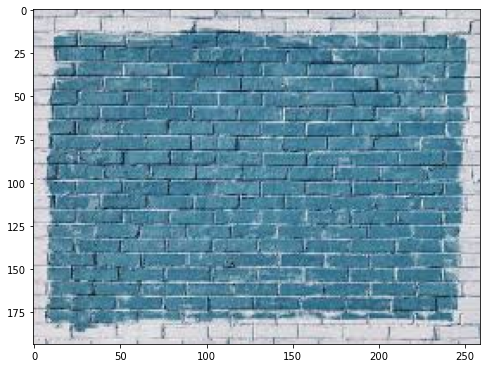

In [73]:
disp_img(img1)

In [74]:
img2 = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img2,text = 'Bricks',org = (10,125),fontFace = font,fontScale = 2,color = (255,0,0),thickness = 1)

array([[[175, 175, 183],
        [200, 200, 208],
        [204, 204, 212],
        ...,
        [196, 197, 201],
        [196, 197, 201],
        [196, 197, 201]],

       [[180, 180, 188],
        [207, 207, 215],
        [207, 207, 215],
        ...,
        [204, 205, 209],
        [204, 205, 209],
        [204, 205, 209]],

       [[186, 186, 194],
        [211, 211, 219],
        [210, 210, 218],
        ...,
        [202, 203, 207],
        [202, 203, 207],
        [202, 203, 207]],

       ...,

       [[222, 220, 223],
        [214, 212, 215],
        [219, 217, 220],
        ...,
        [214, 214, 222],
        [222, 227, 233],
        [215, 218, 225]],

       [[218, 214, 215],
        [217, 215, 218],
        [215, 213, 216],
        ...,
        [208, 209, 214],
        [206, 209, 214],
        [207, 208, 213]],

       [[218, 214, 215],
        [219, 215, 216],
        [215, 213, 218],
        ...,
        [208, 209, 214],
        [208, 209, 214],
        [207, 208, 213]]

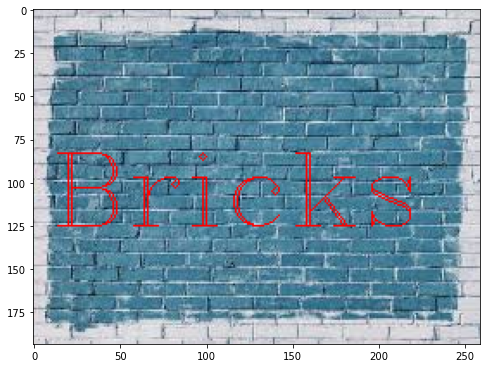

In [75]:
disp_img(img2)

## cv2.filter2D() :

### Making Kernels

In [76]:
#Creating a custom kernel as a filter for our bluring perpous
import numpy as np
kernel = np.ones(shape=(3,3),dtype = np.float32)/6.07 ### WE ARE DIVIDING THAT BY 25(KERNEL SIZE= 5X5)
#TO GET FLOTING VALUES IF WE USE THAT FOR MULTIPLYING THE OTHER IMAGE THEN PIXEL VALUE WILL BE DECREASED OF OTHER IMAGE

In [77]:
1/25

0.04

### How it works?
We use the function `cv2.filter2D()` which will take our filter and apply that on the top of the image as I explained above, that how a blurring and smoothing generally works.
As a result of the blurring, you can see that the image has got so much blurred.
####  Type of Filters: 
There are two types of filters 1.LPF(Low Pass Filter) and 2. HPF(High Pass Filter). LPFs helps to blur an image by removing high-frequency elements like- noise, edges. But, HPFs are the opposite of LPFs, the help to find edges in an image.These are some fundamental theories that should be in mind forever CV aspirant.  
N.B- there are also some filters that do blurring without removing edges of an image. 
#### Arguments:
As arguments, we are gonna pass,
1. "src" --> input image
2. "desired depth" --> we are gonna use `-1` and this is the value you are gonna use often for, which means keeping the input and output depth the same.
3. "Kernel" --> kernel that we want to use.

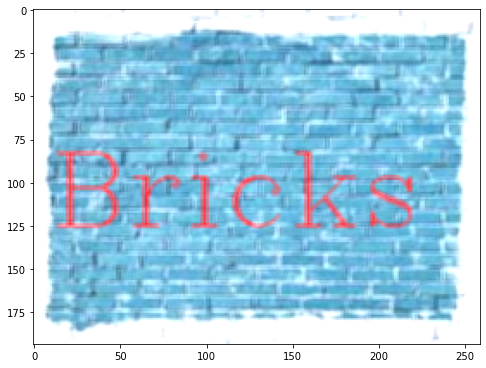

In [78]:
dst = cv2.filter2D(img2,-1,kernel)
disp_img(dst)

## cv2.blur():
In the case of `cv2.blur()` what happens is that it takes the average of all the pixes of an image that belongs to the under of the filter and replace that value with the center pixel and keep doing that by sliding itself again and again. This filter removes edges from an image for blurring purposes.People sometimes call this "Average Blurring". 
##### Analysis of the output:
1. **For the Blue Brick Image** By looking at the output it is quite clear that it removes the edges and the gap inside each letter is also blended which makes clear that the o/p image is a blurred image.  
2. **For the human image**: Output of it is kind of blurry. It is not removing noise.

In [79]:
#Loading image again 
img2 = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img2,text = 'Bricks',org = (10,125),fontFace = font,fontScale = 2,color = (255,0,0),thickness = 1)
print('reset')

reset


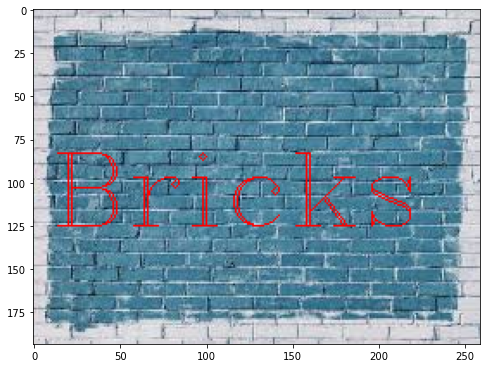

In [80]:
disp_img(img2)

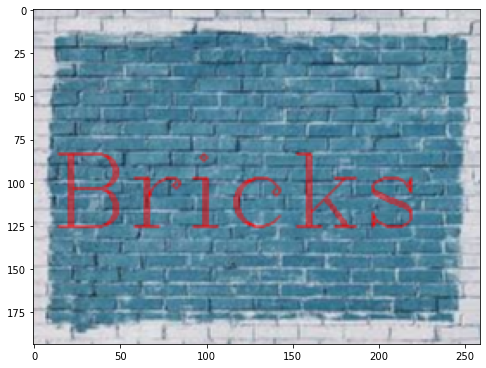

In [81]:
blur = cv2.blur(img2,ksize = (2,2))
disp_img(blur)

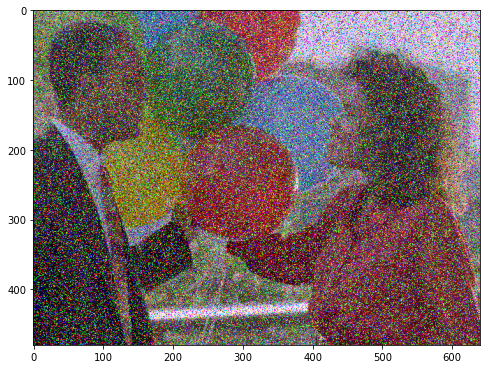

In [82]:
noisy_img2  = cv2.imread('../input/cv-object-detecton-dataset/CV Object Detecton Dataset/balloons_noisy.png')
noisy_img2 = cv2.cvtColor(noisy_img2,cv2.COLOR_BGR2RGB)
disp_img(noisy_img2)


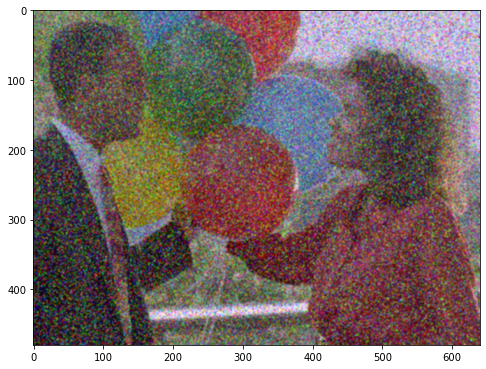

In [83]:
blur = cv2.blur(noisy_img2,ksize = (3,3))
disp_img(blur)

## cv2.GaussianBlur():
Gaussian blur is another type of blurring technique which helps to reduce Gaussian noise and create blur. In this method, the filter which is used is a "Gaussian Filter" which convolves around the image and do the multiplication and summation task, as explained above. As arguments we pass the image then we pass the kernel size and at the last, we pass the standard deviation in the X-direction and the standard deviation in the Y direction, if the only std for X is given the std for Y is taken as equal as the std for X, if it is not given or zero it is computed from the kernel size and kernel size should be positive and odd.We can create an Gaussian kernel using **cv2.getGaussianKernel()**. 
This is how a Gaussian kernel looks like.
<img src="https://i.imgur.com/ZF3OOGr.png" style="width:500px;height:250px;">
<center><p style="padding-left:380px;color:red">Fig1:Visualize a Gaussian Filter</p></center>
<img src="https://i.imgur.com/qgAtxnC.png" style="width:700px;height:250px;">
<center><p style="padding-left:380px;color:red">Fig2:Methemetical form of Gaussian Filter</p></center>
<div>
<p>The pixel values are normally distributed, at the middle pixel value is the highest and at the edges it is the lowest.
And this is the formula,</p>
</div>
<img src="https://i.imgur.com/VyPEexH.png" style="width:400px;height:220px;">
<center><p style="padding-left:380px;color:red">Fig3: Defining the Gaussian function based on the size of sigma(standard deviation)</p></center>

where x is the distance from the origin in the horizontal axis, y is the distance from the origin in the vertical axis, and σ is the standard deviation of the Gaussian distribution.

In [84]:
img2 = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img2,text = 'Bricks',org = (10,125),fontFace = font,fontScale = 2,color = (255,0,0),thickness = 1)
print('reset')

reset


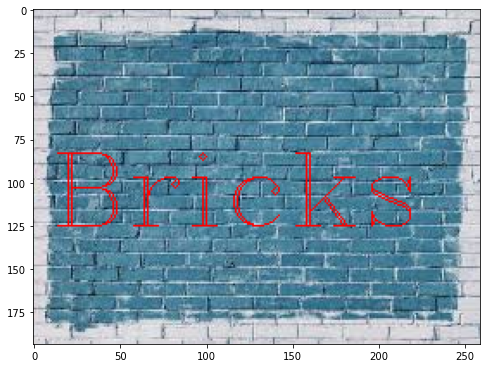

In [85]:
disp_img(img2)

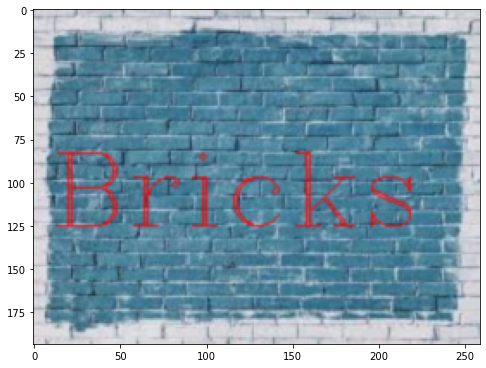

In [86]:
blur_img  = cv2.GaussianBlur(img2,(3,3),0.64)
disp_img(blur_img)

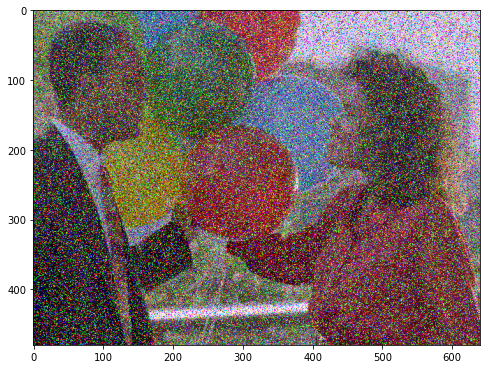

In [87]:
noisy_img1  = cv2.imread('../input/cv-object-detecton-dataset/CV Object Detecton Dataset/balloons_noisy.png')
noisy_img1 = cv2.cvtColor(noisy_img1,cv2.COLOR_BGR2RGB)
disp_img(noisy_img1)


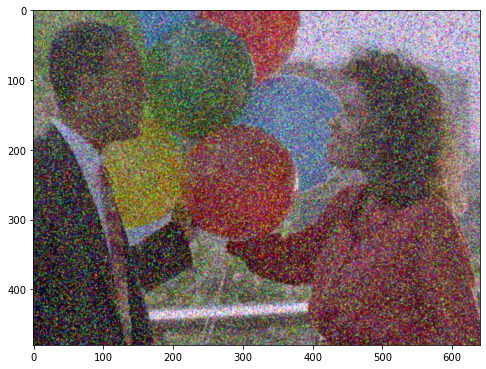

In [88]:
blur_img  = cv2.GaussianBlur(noisy_img1,(3,3),0.64)
disp_img(blur_img)

In [89]:
#Gaussian blur bluring the image but not removing noise from this picture.

##   Median Blur
So, how Median Blur is different from the other ones? Actually, in the median blur, it takes the average of all pixels which are under the filter and then replace the central pixel with that value. And, if the noise type is salt-paper type then you will find using Median blurring very useful. As you can see in the 2nd image with balloons. in the **cv2.medianBlur()** we pass the source image and kernel size(kernel size must be odd and positive).
1. you can use it for Salt-paper noise removing
2. you can also use it for blurring too.

In [90]:
img2 = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img2,text = 'Bricks',org = (10,125),fontFace = font,fontScale = 2,color = (255,0,0),thickness = 1)
print('reset')

reset


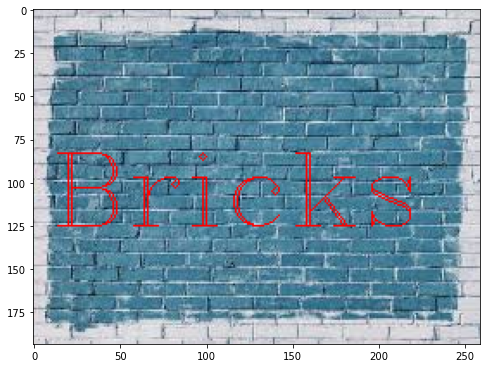

In [91]:
disp_img(img2)

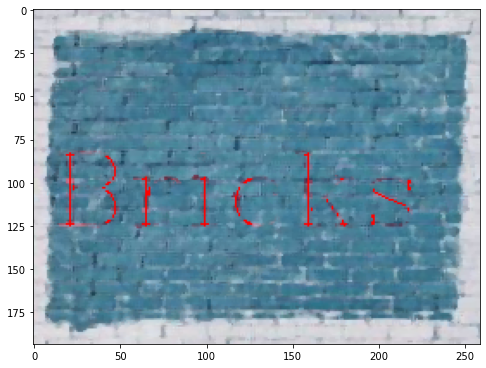

In [92]:
median_blur = cv2.medianBlur(img2,3)
disp_img(median_blur)

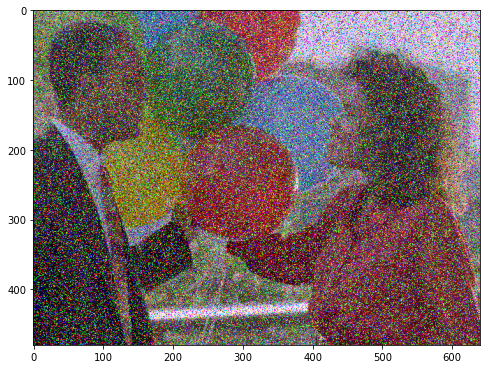

In [93]:
noisy_img  = cv2.imread('../input/cv-object-detecton-dataset/CV Object Detecton Dataset/balloons_noisy.png')
noisy_img = cv2.cvtColor(noisy_img,cv2.COLOR_BGR2RGB)
disp_img(noisy_img)


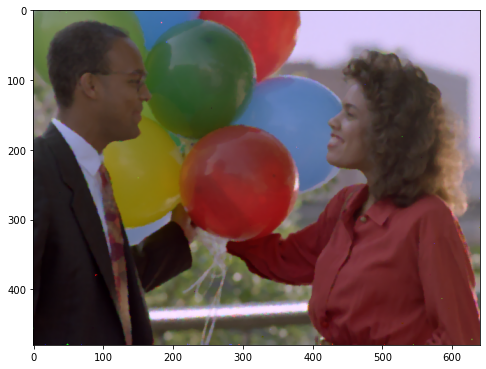

In [94]:
median = cv2.medianBlur(noisy_img,5)
disp_img(median)

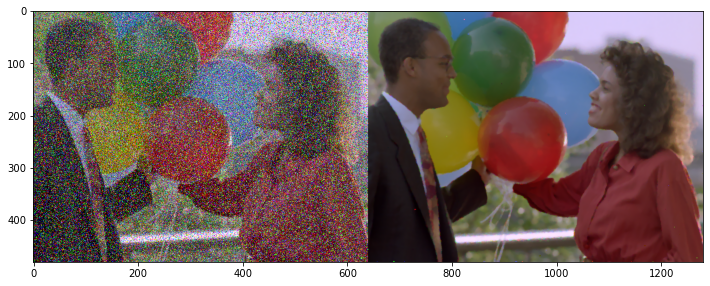

In [95]:
plt.figure(figsize=(12,10))
attatiched = np.concatenate([noisy_img,median],axis=1)
plt.imshow(attatiched)

## Color Histograms:
In the color histogram, we visualize the distribution of pixel values in R, G, and B color channels. This helps us to understand which pixel values are more in number for each color channel. we need to use this when we need to analyze the color distribution of an image. And I hope you guys know the concept behind histograms.
This topic will be having three sub-topics,
1. How to create a normal Histogram?
2. How to create a histogram for all color channels?
3. how to create a histogram for a masked portion an image?
4. how to perform histogram equalizer?

In [96]:
#READING THREE DIFFERENT IMAGES
dark =cv2.imread('../input/cv-object-detecton-dataset/CV Object Detecton Dataset/dark_image.jpg')
dark_img = cv2.cvtColor(dark,cv2.COLOR_BGR2RGB)

rainbo =cv2.imread('../input/cv-object-detecton-dataset/CV Object Detecton Dataset/rainbo.jpg')
rainbo_img = cv2.cvtColor(rainbo,cv2.COLOR_BGR2RGB)

brick =cv2.imread('../input/cv-object-detecton-dataset/CV Object Detecton Dataset/blue_brick.jpg')
brick_img = cv2.cvtColor(brick,cv2.COLOR_BGR2RGB)

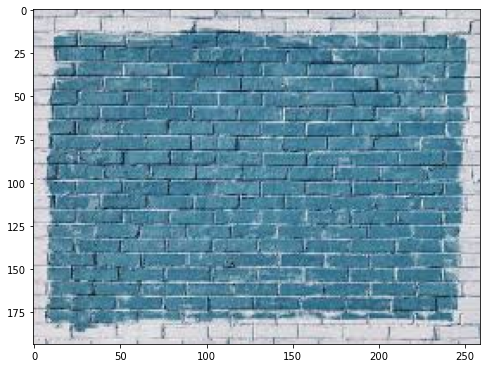

In [97]:
#SHOWING THE IMAGE
disp_img(brick_img)

## How to create the normal Histogram?
To create a normal Histogram we need to use **cv2.calcHist()**, now there are different arguments we need to pass in that function to get the distribution,
- 1st arg: the source image in the form of a list
- 2nd arg: the number of chennel we need
- 3rd arg: I am using any mask or not
- 4th arg: upper limit of the pixel
- 5th arg: range og the pixel 

In [98]:
rainbo_hist = cv2.calcHist([rainbo],channels = [0],mask = None,histSize= [256],ranges = [0,256])

In [99]:
rainbo_hist.shape

(256, 1)

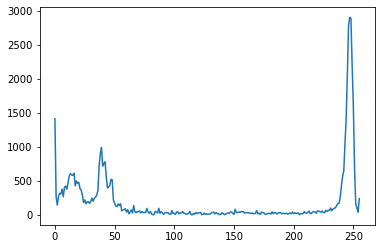

In [100]:
plt.plot(rainbo_hist)
#plt.xlim([0,20])

## How to create a histogram for all color channels?
We will be doing as the normal histograms(mentioned above) are made,by using **cv2.calcHist()** and passing different color channels as the input and rest of the things will be the same.

Text(0.5, 1.0, 'hist for rainbo')

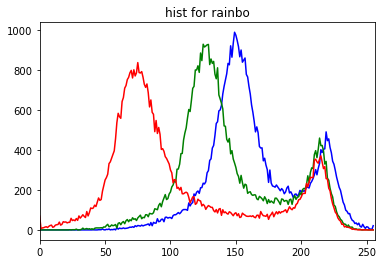

In [101]:
color = ('b','g','r')

for i,col in enumerate(color):
    hist = cv2.calcHist([brick],[i],None,[256],[0,256])
    plt.plot(hist,color = col)
    plt.xlim([0,256])
    #plt.ylim()
plt.title('hist for rainbo')

Here you can see, the blue channel is having two picks around the 150 and the 230 pixel values, which means that the number of pixels which are in majority belongs to the pixel values near to 150 and 230. And for Red and the Green chennel these two values are aproximately 80,210 and 140,210 respectively.

## how to create histogram for a masked portion an image?
Say, you have an image and you want the color histogram of a specific ROI (region of Interest), so to extract that ROI you have to cheate a mask, and then you will do **cv2.bitwise_and()** for getting that ROI. After you get that you just have to follow the above process to get a color histogram and don't forget to pass **mask = the_mask_you_have_created**.

In [102]:
rainbo =cv2.imread('../input/cv-object-detecton-dataset/CV Object Detecton Dataset/rainbo.jpg')
rainbo_img = cv2.cvtColor(rainbo,cv2.COLOR_BGR2RGB)

In [103]:
rainbo_img.shape

(194, 259, 3)

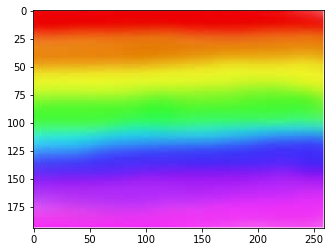

In [104]:
plt.imshow(rainbo_img)

In [105]:
mask = np.zeros(rainbo_img.shape[:2],np.uint8)

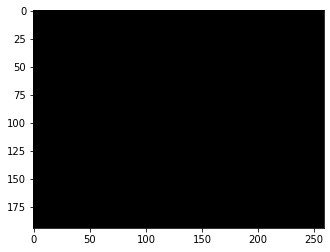

In [106]:
plt.imshow(mask,cmap = 'gray')

In [107]:
mask[75:100,50:100] = 255

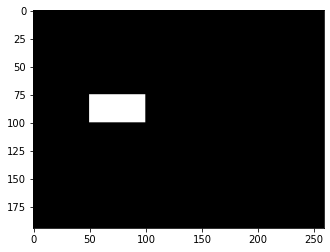

In [108]:
plt.imshow(mask,cmap = 'gray')

In [109]:
masked_img = cv2.bitwise_and(rainbo,rainbo,mask = mask)
show_masked_img = cv2.bitwise_and(rainbo_img,rainbo_img,mask = mask)

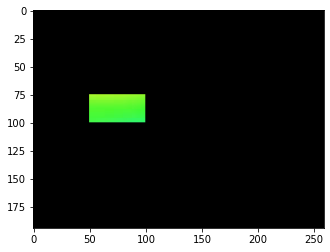

In [110]:
plt.imshow(show_masked_img)

In [111]:
hist_mask = cv2.calcHist([rainbo],[2],mask,[256],[0,256])
#Notice we are only passing "[2]" in the number of color 
#channel which reffers that here we are only interested about "RED" color channel, as in the maskind image we only have
#green color not red so as output we will not have any high picks in the histogram

In [112]:
hist_not_mask = cv2.calcHist([rainbo],[2],None,[256],[0,256])#Performing same thing without mask

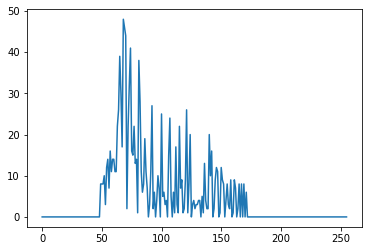

In [113]:
plt.plot(hist_mask)

In [114]:
hist_mask_green = cv2.calcHist([rainbo],[1],mask,[256],[0,256])#trying to plot histogram for only green color channel

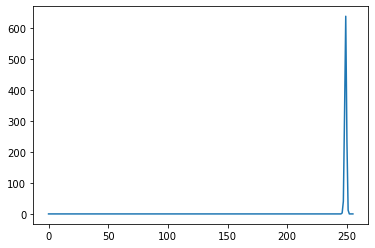

In [115]:
plt.plot(hist_mask_green)

## how to perform histogram equalization?
Histogram Equalization is a method of contrast adjustment based on the image's histogram.

In this image the pixel values are are between 0-255, but we will not find any pixel values which are exactly 0 or 255, it does not have any image which is pure white or pure black.If we apply the histogram equalization then it will reduce the color depth.Currently the minimum pixel value is 52 and the highest is 255.
After you apply histogram equalization, you will find the the min pixel value now got transformed to zero and the max got converted to 255. So, notice again how the min and max values are equalized between 0 and 255, we also see less shade of gray.(view fig1 to 2)

<img src="https://i.imgur.com/mWTXqZ4.png" style="width:500px;height:250px;">
<center><p style="padding-left:380px;color:red">Fig1:before applying histogram equalization</p></center>

<img src="https://i.imgur.com/5diUO7c.png" style="width:500px;height:250px;">
<center><p style="padding-left:380px;color:red">Fig2: After applying histogram equalization</p></center>

Again, now we have a image on the left hand side and it's coresponding histogram(in red) on the right the black line is nothing but the cumulative of the pixel values.So, after we apply the Histogram equalizer that cumulative changes to linear step function. Notice that we don't literally flatten out the histogram we only just focus on the cumulative linear. And the real mathematics behind the Histogram equalization is just like that.(view fig 3 to 5)
<img src="https://i.imgur.com/uIBnzbu.png" style="width:500px;height:250px;">

<center><p style="padding-left:380px;color:red">Fig3:before applying histogram equalization</p></center>

<img src="https://i.imgur.com/fuIGrCi.png" style="width:500px;height:250px;">

<center><p style="padding-left:380px;color:red">Fig4: After applying histogram equalization</p></center>

<img src="https://i.imgur.com/9q3NVIg.png" style="width:500px;height:250px;">
<center><p style="padding-left:380px;color:red">Fig5:Main difference </p></center>

We mainly use histogram equalization when we need to increase the contrast of the image.

In [116]:
gorilla = cv2.imread('../input/cv-object-detecton-dataset/CV Object Detecton Dataset/gorilla.jpg')
gorilla = cv2.cvtColor(gorilla,cv2.COLOR_BGR2GRAY)


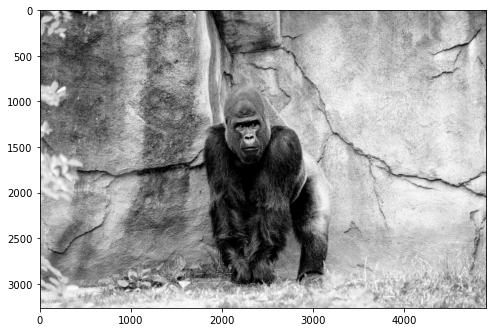

In [117]:
disp_img(gorilla,cmap = 'gray')

In [118]:
eq_gorilla = cv2.equalizeHist(gorilla)

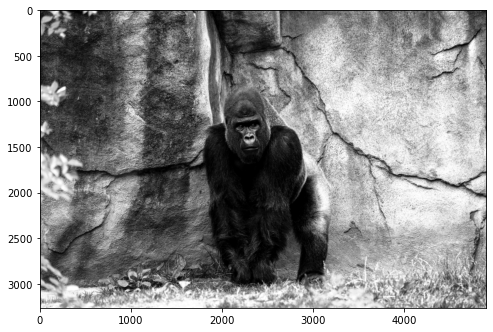

In [119]:
disp_img(eq_gorilla,cmap = 'gray')#After applying histogram equalization

### Line Detection:
Now, we will try to detect lines.so we will simply use **cv2.HoughLinesP()** for doing that along with creating a mask through which we detect the edges using canny edge detector, and then apply that o/p in that Hough line prediction function.

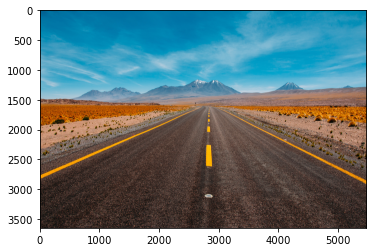

In [120]:
road = cv2.imread('../input/cv-object-detecton-dataset/CV Object Detecton Dataset/yello_road.jpg')
road = cv2.cvtColor(road,cv2.COLOR_BGR2RGB)
plt.imshow(road)

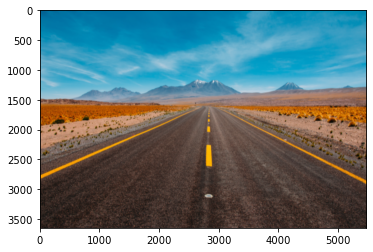

In [121]:
blurry = cv2.GaussianBlur(road,(35,35),0)
plt.imshow(blurry)
blur_img = blurry.copy()

In [122]:
import numpy as np

In [123]:
blur_img4 = blurry.copy()

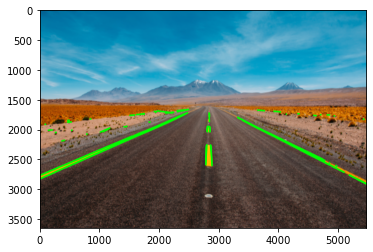

In [124]:
hsv = cv2.cvtColor(blur_img4,cv2.COLOR_RGB2HSV)
low_yellow = np.array([18,94,140])
up_yellow = np.array([48,230,230])
mask = cv2.inRange(hsv,low_yellow,up_yellow)
edge = cv2.Canny(mask,75,150)

line = cv2.HoughLinesP(edge,1,np.pi/180,50,maxLineGap = 50)

for i in line:
    x1,y1,x2,y2 = i[0]
    cv2.line(blur_img4,(x1,y1),(x2,y2),(0,255,0),25)
    
plt.imshow(blur_img4)

### References:
1. https://opencv-python-tutroals.readthedocs.io
2. https://www.kaggle.com/hrmello/intro-to-image-processing-colorspaces
3. https://www.kaggle.com/sanikamal/image-segmentation-using-color-spaces
<p>If there is any query please let me know.</p>